# t-SNE and UMAP

In [1]:
import warnings
warnings.filterwarnings('ignore')

In [2]:
%matplotlib inline

from pathlib import Path
from os.path import join

import pandas as pd
import numpy as np
from numpy.random import choice

from sklearn.datasets import fetch_openml, make_swiss_roll, make_blobs
from sklearn.manifold import TSNE
import umap

import seaborn as sns
import matplotlib.pyplot as plt
from matplotlib.colors import ListedColormap
import ipyvolume as ipv

from plotly.offline import init_notebook_mode, iplot
import plotly.graph_objs as go

import colorlover as cl

In [3]:
sns.set_style('white')

In [4]:
init_notebook_mode(connected=True)
ipv_cmap = sns.color_palette('Paired', n_colors=10)

## T-Stochastic Neighbor Embedding (TSNE): Parameter Settings

[t-SNE](https://lvdmaaten.github.io/tsne/) is an award-winning algorithm developed in 2010 by Laurens van der Maaten and Geoff Hinton to detect patterns in high-dimensional data. It takes a probabilistic, non-linear approach to locating data on several different, but related low-dimensional manifolds. The algorithm emphasizes keeping similar points together in low dimensions, as opposed to maintaining the distance between points that are apart in high dimensions, which results from algorithms like PCA that minimize squared distances. 

The algorithm proceeds by converting high-dimensional distances to (conditional) probabilities, where high probabilities imply low distance and reflect the likelihood of sampling two points based on similarity. It accomplishes this by positioning a normal distribution over each point and computing the density for a point and each neighbor, where the perplexity parameter controls the effective number of neighbors. In a second step, it arranges points in low dimensions and uses similarly computed low-dimensional probabilities to match the high-dimensional distribution. It measures the difference between the distributions using the Kullback-Leibler divergence that puts a high penalty on misplacing similar points in low dimensions. The low-dimensional probabilities use a Student-t distribution with one degree of freedom because it has fatter tails that reduce the penalty of misplacing points that are more distant in high dimensions to manage the crowding problem.

t-SNE is currently the state-of-the-art in high-dimensional data visualization. Weaknesses include the computational complexity that scales quadratically in the number n of points because it evaluates all pairwise distances, but a subsequent tree-based implementation has reduced the cost to n log n. 

t-SNE does not facilitate the projection of new data points into the low-dimensional space. The compressed output is not a very useful input for distance- or density-based cluster algorithms because t-SNE treats small and large distances differently.

### Perplexity: emphasis on local vs global structure

In [5]:
data, label = make_blobs(n_samples=200,
                         n_features=2,
                         centers=2,
                         random_state=42)

In [6]:
colors = ['denim blue', 'pale red']
cmap = ListedColormap(sns.xkcd_palette(colors))

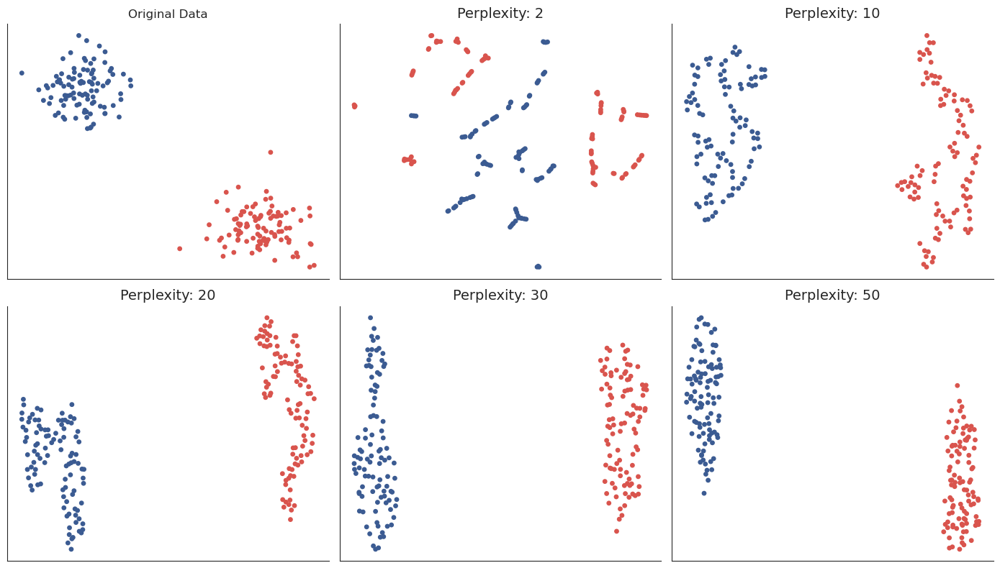

In [7]:
fig, axes = plt.subplots(nrows=2, ncols=3, figsize=(14, 8))
axes = axes.flatten()

axes[0].scatter(data[:, 0], data[:, 1], s=15, c=label, cmap=cmap)
axes[0].set_title('Original Data')
axes[0].axes.get_xaxis().set_visible(False)
axes[0].axes.get_yaxis().set_visible(False)

for i, p in enumerate([2, 10, 20, 30, 50], 1):
    embedding = TSNE(perplexity=p, n_iter=5000).fit_transform(data)
    axes[i].scatter(embedding[:, 0], embedding[:, 1], s=15, c=label, cmap=cmap)
    axes[i].set_title(f'Perplexity: {p:.0f}', fontsize=14)
    axes[i].axes.get_xaxis().set_visible(False)
    axes[i].axes.get_yaxis().set_visible(False)
sns.despine()
fig.tight_layout()

### Convergence with `n_iter`

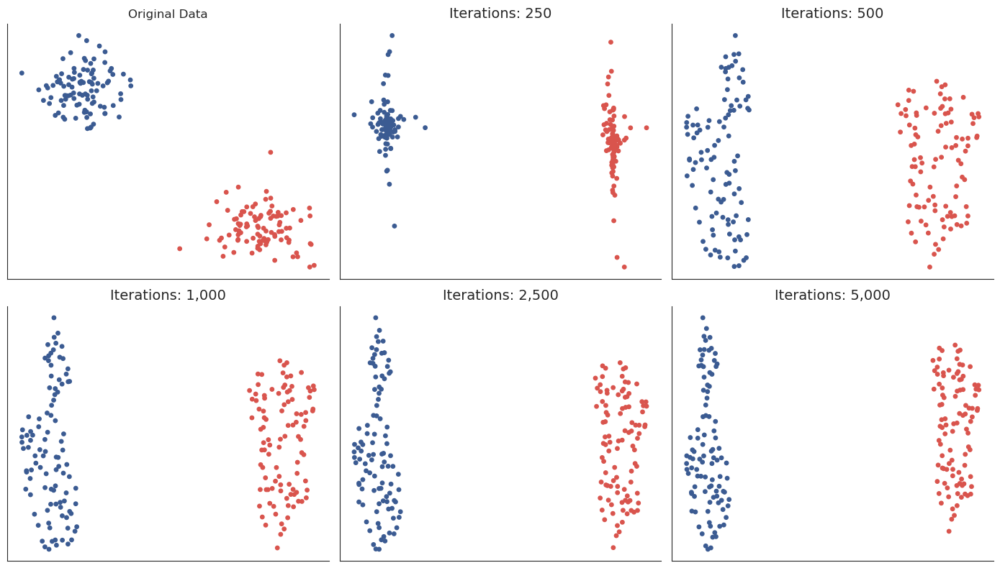

In [8]:
fig, axes = plt.subplots(nrows=2, ncols=3, figsize=(14, 8))
axes = axes.flatten()

axes[0].scatter(data[:, 0], data[:, 1], s=15, c=label, cmap=cmap)
axes[0].set_title('Original Data')
axes[0].axes.get_xaxis().set_visible(False)
axes[0].axes.get_yaxis().set_visible(False)

for i, n in enumerate([250, 500, 1000, 2500, 5000], 1):
    embedding = TSNE(perplexity=30, n_iter=n).fit_transform(data)
    axes[i].scatter(embedding[:, 0], embedding[:, 1], s=15, c=label, cmap=cmap)
    axes[i].set_title(f'Iterations: {n:,.0f}', fontsize=14)
    axes[i].axes.get_xaxis().set_visible(False)
    axes[i].axes.get_yaxis().set_visible(False) 
    
sns.despine()
fig.tight_layout();

### Different Cluster Sizes

In [9]:
data, label = make_blobs(n_samples=200, 
                         n_features=2,
                         cluster_std=[10, 1], 
                         centers=2, 
                         random_state=42)

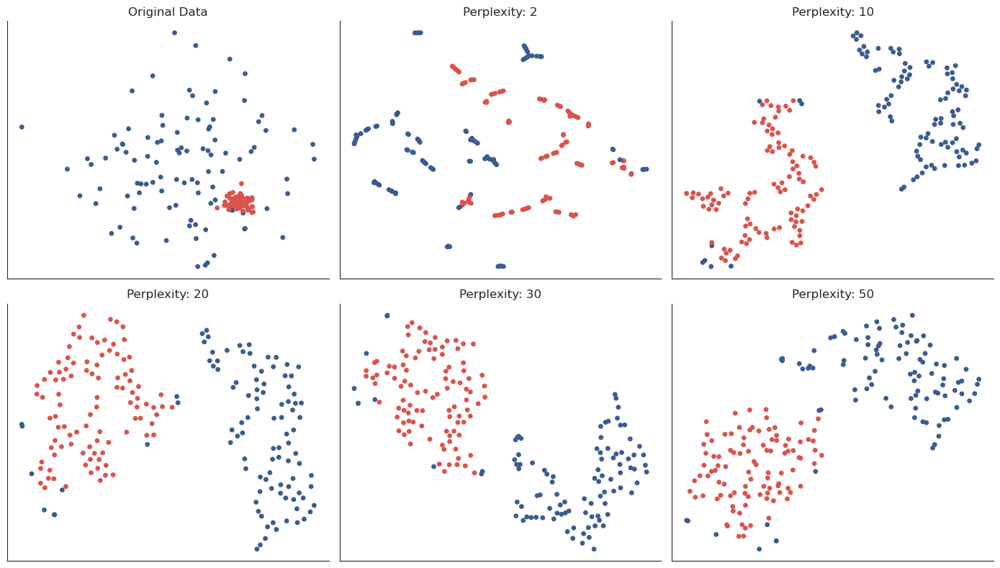

In [10]:
fig, axes = plt.subplots(nrows=2, ncols=3, figsize=(14, 8))
axes = axes.flatten()

axes[0].scatter(data[:, 0], data[:, 1], s=15, c=label, cmap=cmap)
axes[0].set_title('Original Data')
axes[0].axes.get_xaxis().set_visible(False)
axes[0].axes.get_yaxis().set_visible(False)

for i, p in enumerate([2,10, 20, 30, 50], 1):
    embedding = TSNE(perplexity=p, n_iter=5000).fit_transform(data)
    axes[i].scatter(embedding[:, 0], embedding[:, 1], s=15, c=label, cmap=cmap)
    axes[i].set_title(f'Perplexity: {p:.0f}')
    axes[i].axes.get_xaxis().set_visible(False)
    axes[i].axes.get_yaxis().set_visible(False)

sns.despine()
fig.tight_layout();

### Different Cluster Distances

In [11]:
data, label = make_blobs(n_samples=150,
                         n_features=2,
                         centers=[[-10, 0], [-8, 0], [10, 0]],
                         random_state=42)

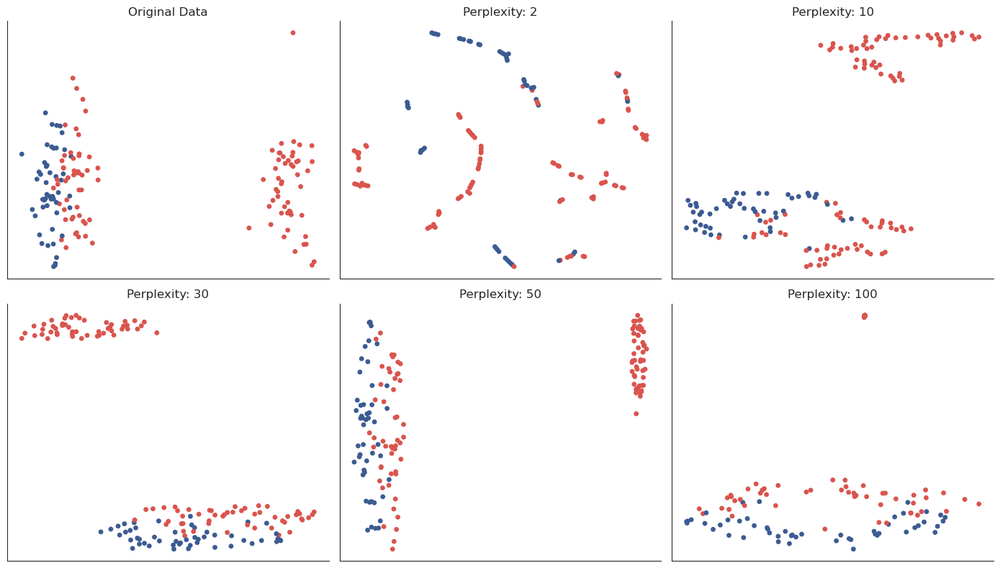

In [12]:
fig, axes = plt.subplots(nrows=2, ncols=3, figsize=(14, 8))
axes = axes.flatten()

axes[0].scatter(data[:, 0], data[:, 1], s=15, c=label, cmap=cmap)
axes[0].set_title('Original Data')
axes[0].axes.get_xaxis().set_visible(False)
axes[0].axes.get_yaxis().set_visible(False)

for i, p in enumerate([2,10, 30, 50, 100], 1):
    embedding = TSNE(perplexity=p, n_iter=5000).fit_transform(data)
    axes[i].scatter(embedding[:, 0], embedding[:, 1], s=15, c=label, cmap=cmap)
    axes[i].set_title('Perplexity: {:.0f}'.format(p))
    axes[i].axes.get_xaxis().set_visible(False)
    axes[i].axes.get_yaxis().set_visible(False)

sns.despine()
fig.tight_layout();

### More points require higher perplexity

In [13]:
data, label = make_blobs(n_samples=600,
                         n_features=2,
                         centers=[[-10, 0], [-8, 0], [10, 0]],
                         random_state=42)

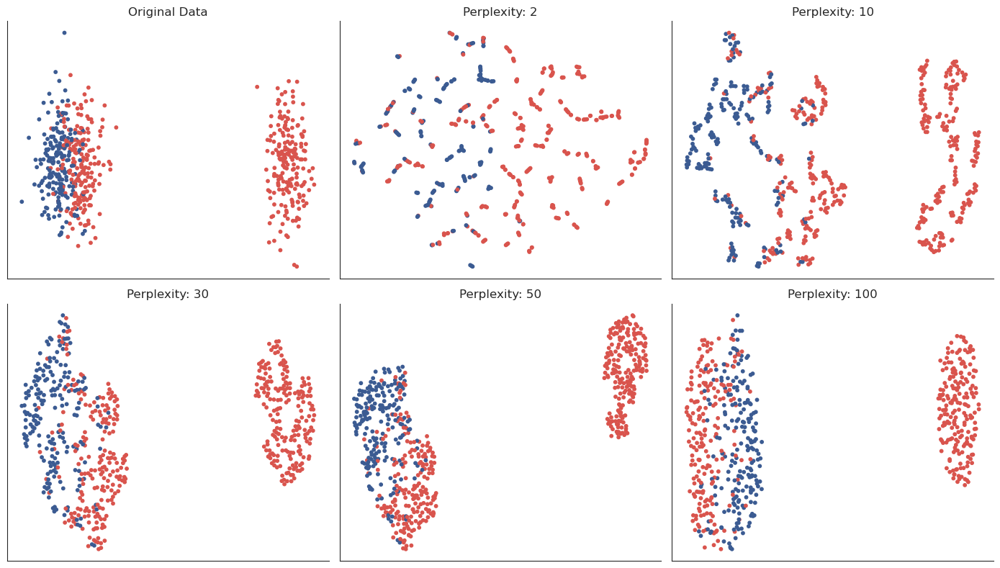

In [14]:
fig, axes = plt.subplots(nrows=2, ncols=3, figsize=(14, 8))
axes = axes.flatten()

axes[0].scatter(data[:, 0], data[:, 1], s=10, c=label, cmap=cmap)
axes[0].set_title('Original Data')
axes[0].axes.get_xaxis().set_visible(False)
axes[0].axes.get_yaxis().set_visible(False)


for i, p in enumerate([2,10, 30, 50, 100], 1): 
    embedding = TSNE(perplexity=p, n_iter=5000).fit_transform(data)
    axes[i].scatter(embedding[:, 0], embedding[:, 1], s=10, c=label, cmap=cmap)
    axes[i].set_title('Perplexity: {:.0f}'.format(p))
    axes[i].axes.get_xaxis().set_visible(False)
    axes[i].axes.get_yaxis().set_visible(False)

sns.despine()
fig.tight_layout();

## Uniform Manifold Approximation and Projection (UMAP): Parameter Settings

[UMAP](https://github.com/lmcinnes/umap) is a more recent algorithm for visualization and general dimensionality reduction. It assumes the data is uniformly distributed on a locally connected manifold and looks for the closest low-dimensional equivalent using fuzzy topology. It uses a neighbors parameter that impacts the result similarly as perplexity above.

It is faster and hence scales better to large datasets than t-SNE, and sometimes preserves global structure than better than t-SNE. It can also work with different distance functions, including, e.g., cosine similarity that is used to measure the distance between word count vectors.

### Neighbors

In [15]:
data, label = make_blobs(n_samples=600,
                         n_features=2,
                         centers=2,
                         random_state=42)

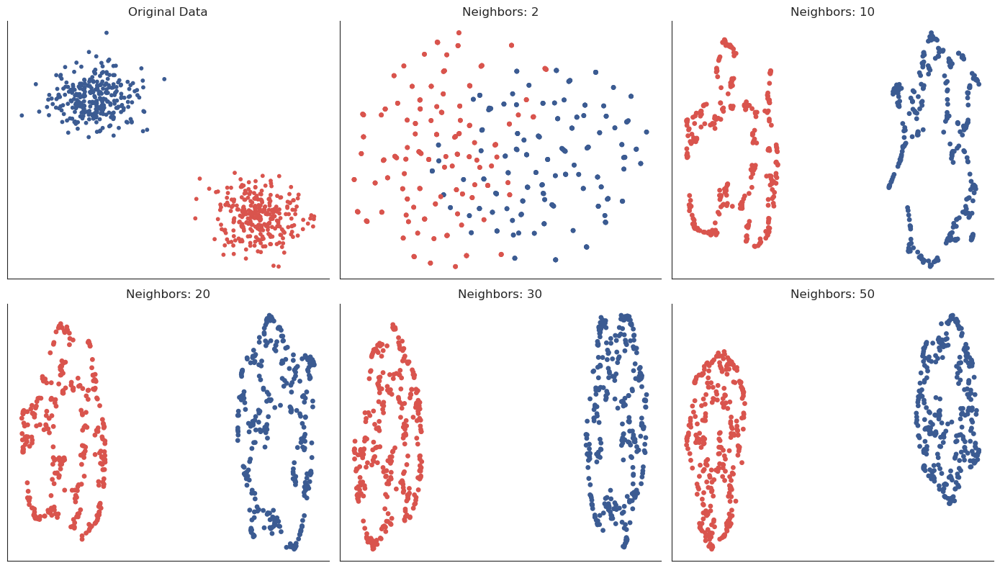

In [16]:
fig, axes = plt.subplots(nrows=2, ncols=3, figsize=(14, 8))
axes = axes.flatten()
axes[0].scatter(data[:, 0], data[:, 1], s=10, c=label, cmap=cmap)
axes[0].set_title('Original Data')
axes[0].axes.get_xaxis().set_visible(False)
axes[0].axes.get_yaxis().set_visible(False)

for i, n in enumerate([2,10, 20, 30, 50], 1):
    embedding = umap.UMAP(n_neighbors=n, min_dist=0.1).fit_transform(data)    
    axes[i].scatter(embedding[:, 0], embedding[:, 1], s=15, c=label, cmap=cmap)
    axes[i].set_title(f'Neighbors: {n:.0f}')
    axes[i].axes.get_xaxis().set_visible(False)
    axes[i].axes.get_yaxis().set_visible(False)

sns.despine()
fig.tight_layout();

### Minimum Distance

In [17]:
data, label = make_blobs(n_samples=200,
                         n_features=2,
                         centers=2,
                         random_state=42)

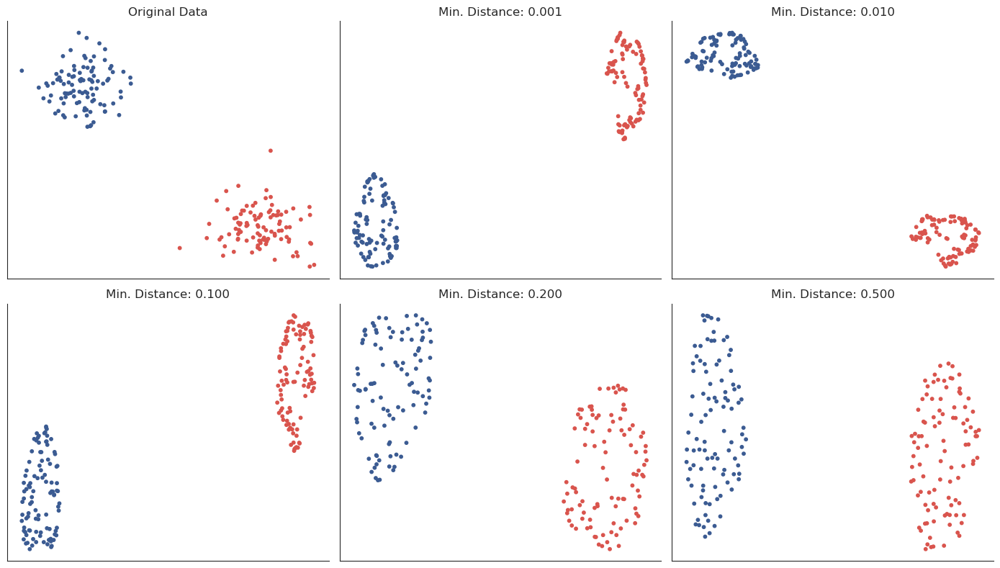

In [18]:
fig, axes = plt.subplots(nrows=2, ncols=3, figsize=(14, 8))
axes = axes.flatten()

axes[0].scatter(data[:, 0], data[:, 1], s=10, c=label, cmap=cmap)
axes[0].set_title('Original Data')
axes[0].axes.get_xaxis().set_visible(False)
axes[0].axes.get_yaxis().set_visible(False)

for i, d in enumerate([.001, .01, .1, .2, .5], 1):
    embedding = umap.UMAP(n_neighbors=30, min_dist=d).fit_transform(data)
    axes[i].scatter(embedding[:, 0], embedding[:, 1], s=10, c=label, cmap=cmap)
    axes[i].set_title('Min. Distance: {:.3f}'.format(d))
    axes[i].axes.get_xaxis().set_visible(False)
    axes[i].axes.get_yaxis().set_visible(False)

sns.despine()
fig.tight_layout();

## Non-Linear Manifolds: Swiss Roll

In [19]:
n_samples = 10_000
palette = sns.color_palette('viridis',
                            n_colors=n_samples)

In [20]:
zeros = np.zeros(n_samples) + .5
swiss_3d, swiss_val = make_swiss_roll(n_samples=n_samples,
                                      noise=.1,
                                      random_state=42)

swiss_3d = swiss_3d[swiss_val.argsort()[::-1]]
x, y, z = swiss_3d.T

### TSNE

Using pre-computed T-SNE and UMAP results due to the long running times, esp. for T-SNE.

In [21]:
data_path = Path('data')
swiss_path = data_path / 'swiss_roll'

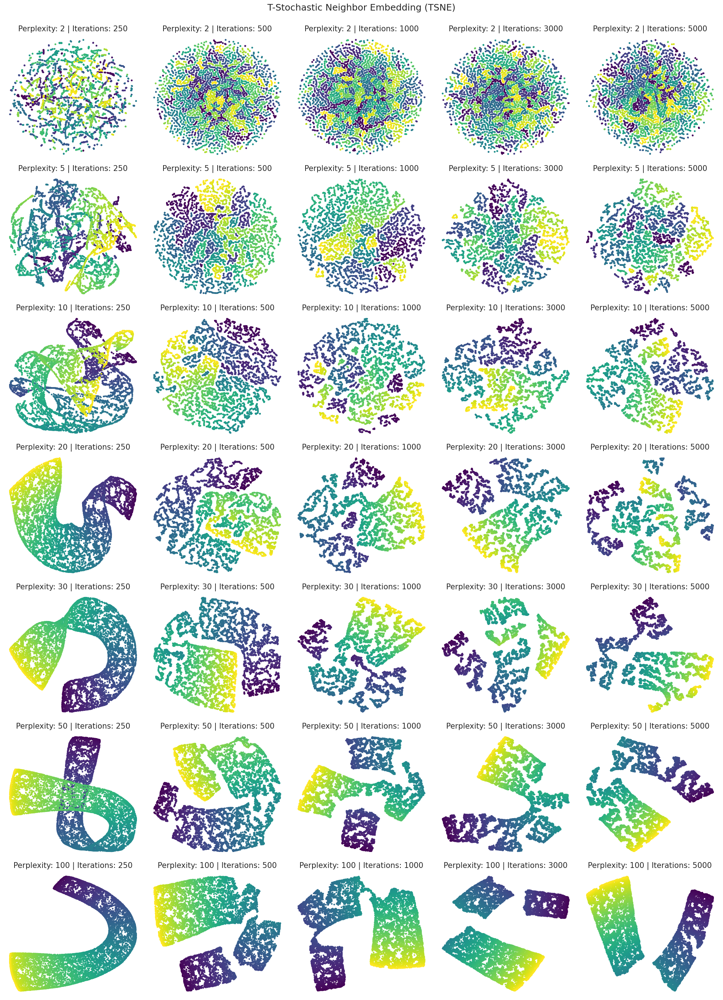

In [22]:
fig, axes = plt.subplots(nrows=7, ncols=5, figsize=(20, 28))

method = 'tsne'
path = swiss_path / method
labels = np.load(swiss_path / 'labels.npy')

for row, perplexity in enumerate([2, 5, 10, 20, 30, 50, 100]):
    for col, n_iter in enumerate([250, 500, 1000, 3000, 5000]):
        x, y = np.load(swiss_path / method / f'{perplexity}_{n_iter}.npy').T
        axes[row, col].scatter(x, y, c=palette, s=5)
        axes[row, col].set_title(f'Perplexity: {perplexity} | Iterations: {n_iter}',
                                 fontsize=15)
        axes[row, col].axis('off')

fig.suptitle('T-Stochastic Neighbor Embedding (TSNE)', fontsize=18)
fig.tight_layout()
fig.subplots_adjust(top=.95)

### UMAP

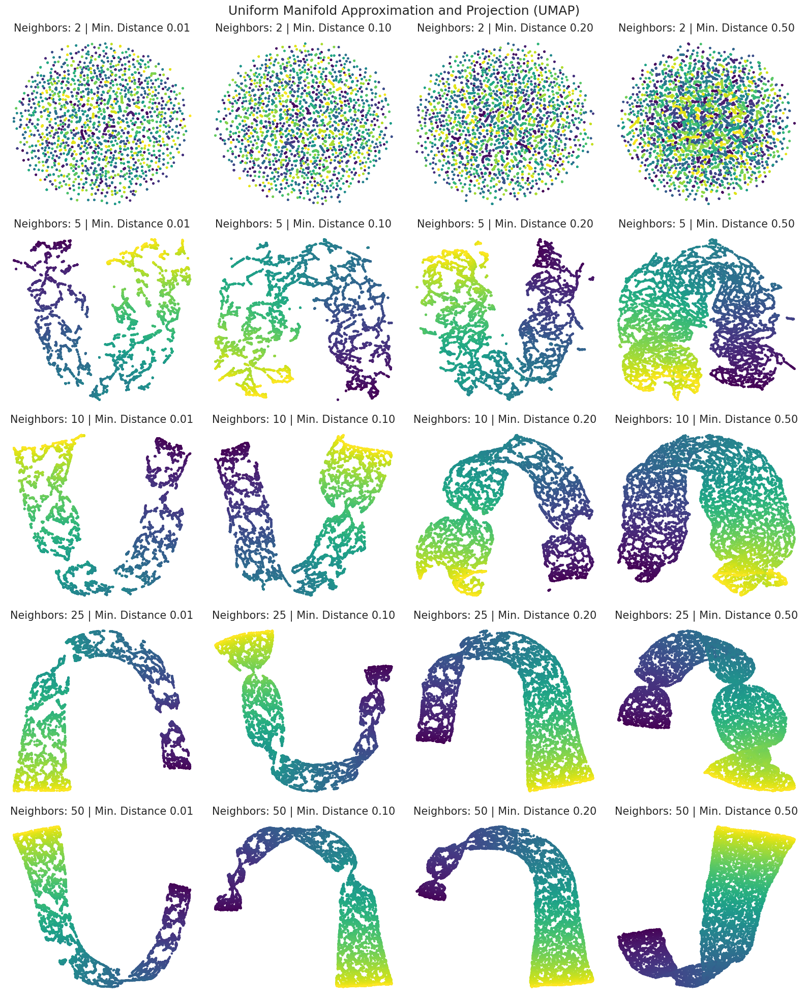

In [23]:
fig, axes = plt.subplots(nrows=5, ncols=4, figsize=(16, 20))
method = 'umap'

path = swiss_path / method
labels = np.load(swiss_path / 'labels.npy')

for row, n_neighbors in enumerate([2, 5, 10, 25, 50]):
    for col, min_distance in enumerate([1, 10, 20, 50]):
        x, y = np.load(swiss_path / method / f'{n_neighbors}_{min_distance}.npy').T
        axes[row, col].scatter(x, y, c=palette, s=5)
        axes[row, col].set_title(f'Neighbors: {n_neighbors} | Min. Distance {min_distance/100:.2f}',
                                fontsize=15)
        axes[row, col].axis('off')

fig.tight_layout()
fig.suptitle('Uniform Manifold Approximation and Projection (UMAP)', fontsize=18)
fig.subplots_adjust(top=.95)

## Handwritten Digits

In [24]:
DATA_PATH = Path('..', '..', 'data')
mnist_src_path = DATA_PATH / 'mnist'

In [25]:
mnist_data = np.load(mnist_src_path / 'data.npy')
mnist_label = np.load(mnist_src_path / 'labels.npy')

In [26]:
digits = np.arange(10)
n_digits = len(digits)

    0  |  1  |  2  |  3  |  4  |  5  |  6  |  7  |  8  |  9


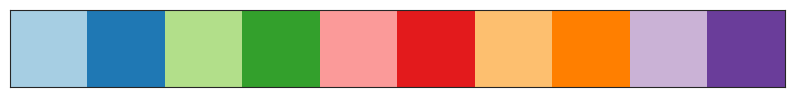

In [27]:
ipv_cmap = sns.color_palette('Paired', 
                             n_colors=n_digits)
print('   ', '  |  '.join([str(d) for d in digits]))
sns.palplot(ipv_cmap)

### Plot sample images

In [28]:
h = w = int(np.sqrt(mnist_data.shape[1])) # 28 x 28 pixels
n_samples = 15

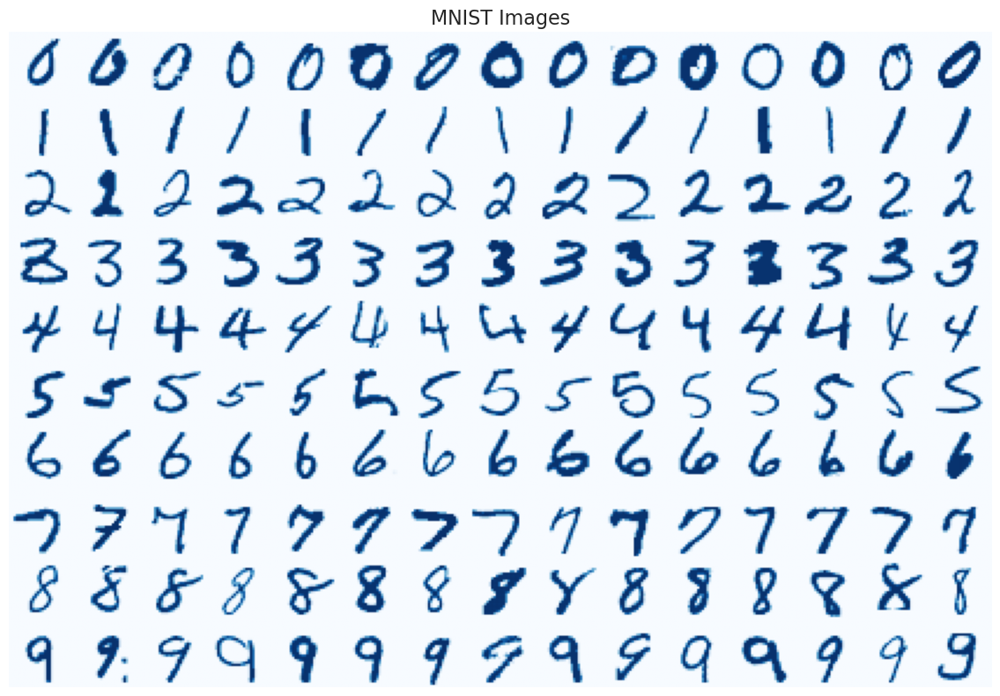

In [29]:
fig, ax = plt.subplots(figsize=(18, 8))
mnist_sample = np.empty(shape=(h * len(digits),
                                 w * n_samples))

for row, label in enumerate(digits):
    label_idx = np.argwhere(mnist_label == label).squeeze()
    sample_indices = choice(label_idx, size=n_samples, replace=False)
    i = row * h
    for col, sample_idx in enumerate(sample_indices):
        j = col * w
        sample = mnist_data[sample_idx].reshape(h, w)
        mnist_sample[i:i+h, j:j + w] = sample

ax.imshow(mnist_sample, cmap='Blues')
ax.set_title('MNIST Images', fontsize=16)
plt.axis('off')
fig.tight_layout()

In [30]:
plotly_cmap = cl.to_rgb( cl.scales['10']['qual']['Paired'])
def plotly_scatter(data, label, title, color, x='x', y='y'):
    fig = dict(
        data=[
            dict(
                type='scattergl',
                x=data[:, 0],
                y=data[:, 1],
                legendgroup="group",
                text=label.astype(int),
                mode='markers',
                marker=Marker(
                    size=5,
                    color=color,
                    autocolorscale=False,
                    showscale=False,
                    opacity=.9,
                    colorbar=ColorBar(
                        title='Class'
                    ),
                    line=dict(width=1))),
        ],
        layout=dict(title=title,
                    width=1200,
                    font=dict(color='white'),
                    xaxis=dict(
                        title=x, 
                        hoverformat='.1f', 
                        showgrid=False),
                    yaxis=dict(title=y, 
                               hoverformat='.1f', 
                               showgrid=False),
                    paper_bgcolor='rgba(0,0,0,0)',
                    plot_bgcolor='rgba(0,0,0,0)'
                    ))

    iplot(fig, show_link=False)

### t-SNE and UMAP Visualization

In [31]:
mnist_emb_path = Path('data', 'mnist')

In [32]:
methods = ['tsne', 'umap']

params = {'tsne': [5, 10, 20, 35],
          'umap': [5, 15, 25, 35]}

param_labels = {'tsne': 'Perplexity',
                'umap': 'Neighbors'}

In [33]:
labels = np.load(mnist_emb_path / 'labels.npy')
color = [sns.color_palette('Paired', 10)[int(i)] for i in labels]

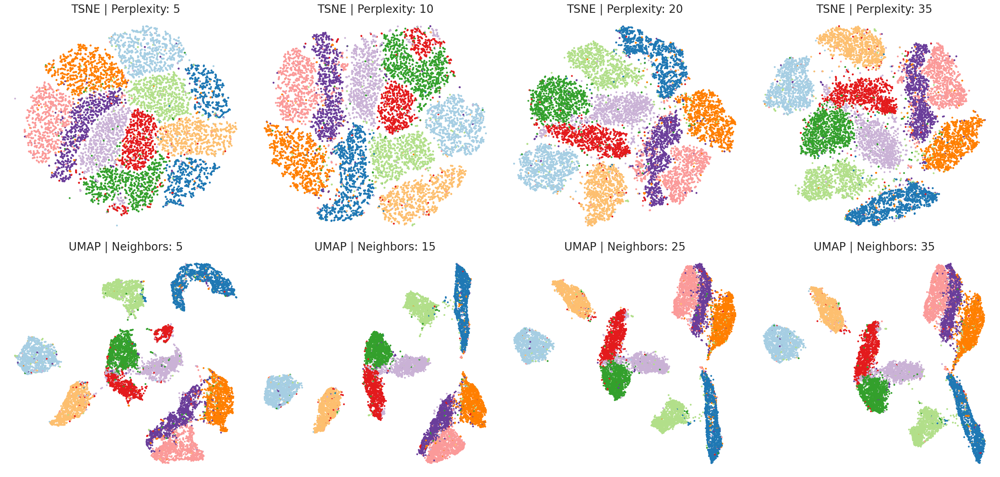

In [34]:
fig, axes = plt.subplots(nrows=2, ncols=4, figsize=(25, 12))
    
for row, method in enumerate(methods):
    for col, param in enumerate(params[method]):
        x, y = np.load(mnist_emb_path / method / f'{param}.npy').T
        axes[row, col].scatter(x, y, c=color, s=5)
        title = f'{method.upper()} | {param_labels[method]}: {param}'
        axes[row, col].set_title(title, fontsize=20)
        axes[row, col].axis('off')

fig.tight_layout();

## Load Fashion MNIST Data

In [35]:
fashion_src_path = DATA_PATH / 'fashion_mnist'

In [36]:
fashion_data = np.load(fashion_src_path / 'data.npy')
fashion_label = np.load(fashion_src_path / 'labels.npy')

classes = sorted(np.unique(fashion_label).astype(int))

In [38]:
named_classes = pd.read_csv(fashion_src_path / 'label_dict.csv',
                            header=None).squeeze().to_list()

In [39]:
h = w = int(np.sqrt(fashion_data.shape[1])) # 28 x 28 pixels
n_samples = 15

### Plot sample images

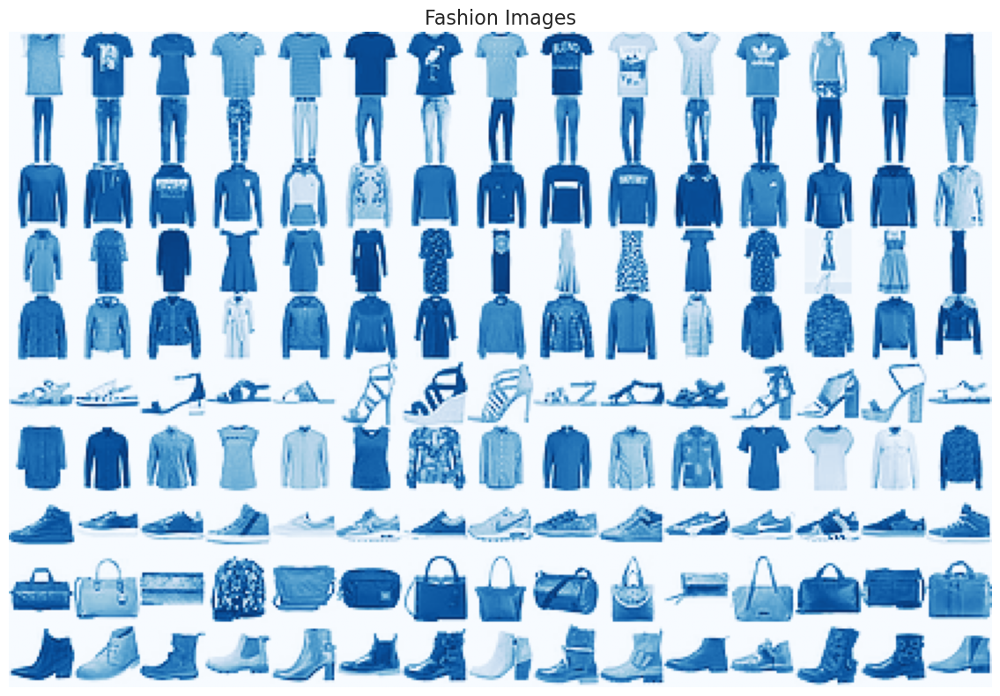

In [40]:
fig, ax = plt.subplots(figsize=(18, 8))
fashion_sample = np.empty(shape=(h * len(classes),
                                 w * n_samples))

for row, label in enumerate(classes):
    label_idx = np.argwhere(fashion_label == label).squeeze()
    sample_indices = choice(label_idx, size=n_samples, replace=False)
    i = row * h
    for col, sample_idx in enumerate(sample_indices):
        j = col * w
        sample = fashion_data[sample_idx].reshape(h, w)
        fashion_sample[i:i+h, j:j + w] = sample

ax.imshow(fashion_sample, cmap='Blues')
ax.set_title('Fashion Images', fontsize=16)
plt.axis('off')
fig.tight_layout()

### t-SNE and UMAP: Parameter Settings

The upper panels of the following chart show how t-SNE is able to differentiate between the image classes. A higher perplexity value increases the number of neighbors used to compute local structure and gradually results in more emphasis on global relationships.

The below figure illustrates how UMAP does indeed move the different clusters further apart, whereas t-SNE provides more granular insight into the local structure.

In [41]:
fashion_emb_path = Path('data', 'fashion')

In [42]:
params = {'tsne': [10, 20, 30, 50],
          'umap': [5, 15, 25, 35]}

In [43]:
labels = np.load(fashion_emb_path / 'labels.npy')
color = [sns.color_palette('Paired', 10)[int(i)] for i in labels]

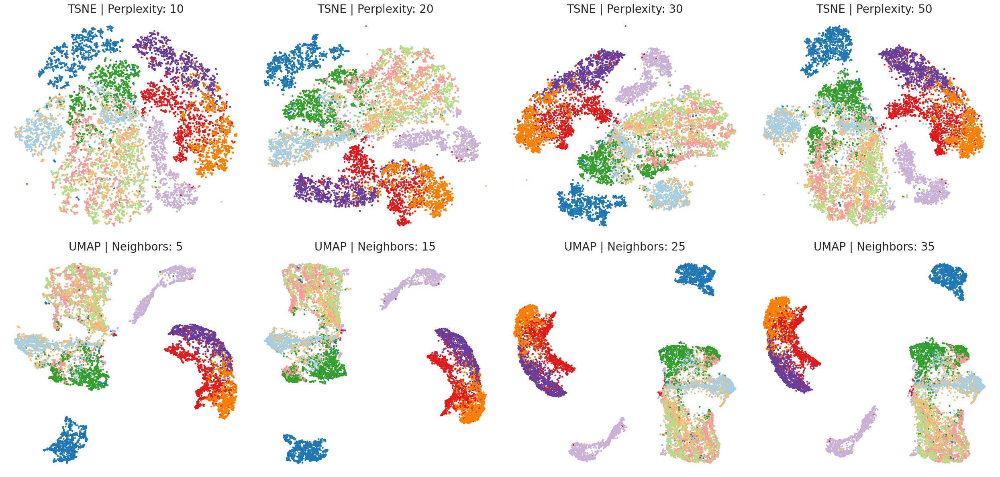

In [44]:
fig, axes = plt.subplots(nrows=2, ncols=4, figsize=(25, 12))

for row, method in enumerate(methods):
    for col, param in enumerate(params[method]):
        x, y = np.load(fashion_emb_path / method / f'{param}.npy').T
        axes[row, col].scatter(x, y, c=color, s=5)
        title = '{} | {}: {}'.format(method.upper(), param_labels[method], param)
        axes[row, col].set_title(title, fontsize=20)
        axes[row, col].axis('off')

fig.tight_layout();

In [45]:
plotly_cmap = cl.to_rgb( cl.scales['10']['qual']['Paired'])
def plotly_scatter(data, label, title, color, x='x', y='y'):
    fig = dict(
        data=[
            dict(
                type='scattergl',
                x=data[:, 0],
                y=data[:, 1],
                legendgroup="group",
                text=label.astype(int),
                mode='markers',
                marker=dict(
                    size=5,
                    color=color,
                    autocolorscale=True,
                    showscale=False,
                    opacity=.9,
                    colorbar=go.scattergl.marker.ColorBar(
                        title='Class'
                    ),
                    line=dict(width=1))),
        ],
        layout=dict(title=title,
                    width=1200,
                    font=dict(color='white'),
                    xaxis=dict(
                        title=x, 
                        hoverformat='.1f', 
                        showgrid=False),
                    yaxis=dict(title=y, 
                               hoverformat='.1f', 
                               showgrid=False),
                    paper_bgcolor='rgba(0,0,0,0)',
                    plot_bgcolor='rgba(0,0,0,0)'
                    ))

    iplot(fig, show_link=False)

### Plotly: t-SNE

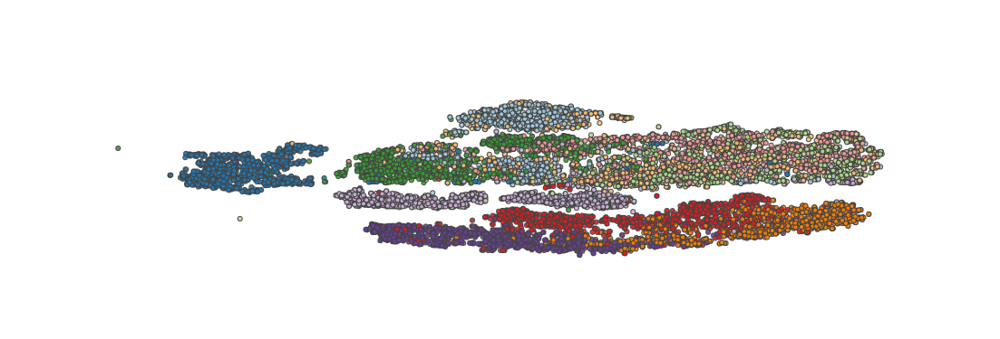

In [46]:
data = np.load(fashion_emb_path / 'tsne' / '25.npy')
plotly_color = [plotly_cmap[int(i)] for i in labels]

plotly_scatter(data=data, 
               title='MNIST TSNE Projection',
               label=labels,
               color=plotly_color)

### Plotly UMAP

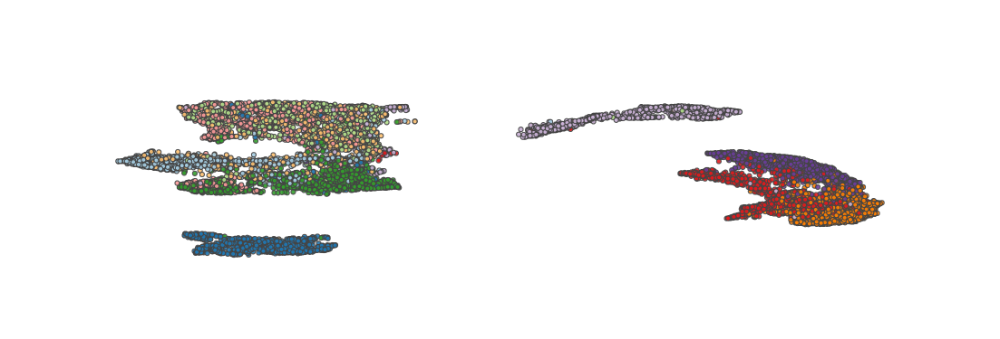

In [47]:
data = np.load(fashion_emb_path / 'umap' / '15.npy')
plotly_color = [plotly_cmap[int(i)] for i in labels]
plotly_scatter(data=data, 
               title='MNIST UMAP Projection',
               label=labels,
               color=plotly_color)

### t-SNE in 3D

In [48]:
data = np.load(fashion_emb_path / 'tsne' / '25_3d.npy')

ipv_color = [ipv_cmap[int(t)] for t in labels]
ipv.quickscatter(*data.T, size=.8, color=ipv_color, marker='sphere')

Container(figure=Figure(box_center=[0.5, 0.5, 0.5], box_size=[1.0, 1.0, 1.0], camera=PerspectiveCamera(fov=45.…